In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Training Generative Adversarial Networks (GANs) in PyTorch

### Part 7 of "Deep Learning with Pytorch: Zero to GANs"

This tutorial series is a hands-on beginner-friendly introduction to deep learning using [PyTorch](https://pytorch.org), an open-source neural networks library. These tutorials take a practical and coding-focused approach. The best way to learn the material is to execute the code and experiment with it yourself. Check out the full series here:

1. [PyTorch Basics: Tensors & Gradients](https://jovian.ai/aakashns/01-pytorch-basics)
2. [Gradient Descent & Linear Regression](https://jovian.ai/aakashns/02-linear-regression)
3. [Working with Images & Logistic Regression](https://jovian.ai/aakashns/03-logistic-regression)
4. [Training Deep Neural Networks on a GPU](https://jovian.ai/aakashns/04-feedforward-nn)
5. [Image Classification using Convolutional Neural Networks](https://jovian.ai/aakashns/05-cifar10-cnn)
6. [Data Augmentation, Regularization and ResNets](https://jovian.ai/aakashns/05b-cifar10-resnet)
7. [Generating Images using Generative Adversarial Networks](https://jovian.ai/aakashns/06b-anime-dcgan/)


### How to run the code

This tutorial is an executable [Jupyter notebook](https://jupyter.org) hosted on [Jovian](https://www.jovian.ai). You can _run_ this tutorial and experiment with the code examples in a couple of ways: *using free online resources* (recommended) or *on your computer*.

#### Option 1: Running using free online resources (1-click, recommended)

The easiest way to start executing the code is to click the **Run** button at the top of this page and select **Run on Colab**. [Google Colab](https://colab.research.google.com) is a free online platform for running Jupyter notebooks using Google's cloud infrastructure. You can also select "Run on Binder" or "Run on Kaggle" if you face issues running the notebook on Google Colab.


#### Option 2: Running on your computer locally

To run the code on your computer locally, you'll need to set up [Python](https://www.python.org), download the notebook and install the required libraries. We recommend using the [Conda](https://docs.conda.io/projects/conda/en/latest/user-guide/install/) distribution of Python. Click the **Run** button at the top of this page, select the **Run Locally** option, and follow the instructions.

### Using a GPU for faster training

You can use a [Graphics Processing Unit](https://en.wikipedia.org/wiki/Graphics_processing_unit) (GPU) to train your models faster if your execution platform is connected to a GPU manufactured by NVIDIA. Follow these instructions to use a GPU on the platform of your choice:

* _Google Colab_: Use the menu option "Runtime > Change Runtime Type" and select "GPU" from the "Hardware Accelerator" dropdown.
* _Kaggle_: In the "Settings" section of the sidebar, select "GPU" from the "Accelerator" dropdown. Use the button on the top-right to open the sidebar.
* _Binder_: Notebooks running on Binder cannot use a GPU, as the machines powering Binder aren't connected to any GPUs.
* _Linux_: If your laptop/desktop has an NVIDIA GPU (graphics card), make sure you have installed the [NVIDIA CUDA drivers](https://docs.nvidia.com/cuda/cuda-installation-guide-linux/index.html).
* _Windows_: If your laptop/desktop has an NVIDIA GPU (graphics card), make sure you have installed the [NVIDIA CUDA drivers](https://docs.nvidia.com/cuda/cuda-installation-guide-microsoft-windows/index.html).
* _macOS_: macOS is not compatible with NVIDIA GPUs


If you do not have access to a GPU or aren't sure what it is, don't worry, you can execute all the code in this tutorial just fine without a GPU.

# Introduction to Generative Modeling

Deep neural networks are used mainly for supervised learning: classification or regression. Generative Adversarial Networks or GANs, however, use neural networks for a very different purpose: Generative modeling

> Generative modeling is an unsupervised learning task in machine learning that involves automatically discovering and learning the regularities or patterns in input data in such a way that the model can be used to generate or output new examples that plausibly could have been drawn from the original dataset. - [Source](https://machinelearningmastery.com/what-are-generative-adversarial-networks-gans/)

To get a sense of the power of generative models, just visit [thispersondoesnotexist.com](https://thispersondoesnotexist.com). Every time you reload the page, a new image of a person's face is generated on the fly. The results are pretty fascinating:

<img src="https://imgix.bustle.com/inverse/4b/17/8f/0e/cf91/4506/99c7/e6a491c5d4ac/these-people-are-not-real--they-were-produced-by-our-generator-that-allows-control-over-different-a.png" style="width:480px; margin-bottom:32px"/>

While there are many approaches used for generative modeling, a Generative Adversarial Network takes the following approach:

<img src="https://i.imgur.com/6NMdO9u.png" style="width:420px; margin-bottom:32px"/>

There are two neural networks: a *Generator* and a *Discriminator*. The generator generates a "fake" sample given a random vector/matrix, and the discriminator attempts to detect whether a given sample is "real" (picked from the training data) or "fake" (generated by the generator). Training happens in tandem: we train the discriminator for a few epochs, then train the generator for a few epochs, and repeat. This way both the generator and the discriminator get better at doing their jobs.

GANs however, can be notoriously difficult to train, and are extremely sensitive to hyperparameters, activation functions and regularization. In this tutorial, we'll train a GAN to generate images of anime characters' faces.

<img src="https://i.imgur.com/NaKtJs0.png" width="360" style="margin-bottom:32px"/>


We'll use the [Anime Face Dataset](https://github.com/Mckinsey666/Anime-Face-Dataset), which consists of over 63,000 cropped anime faces. Note that generative modeling is an unsupervised learning task, so the images do not have any labels. Most of the code in this tutorial is based [on this notebook](https://www.kaggle.com/splcher/starter-anime-face-dataset).

In [2]:
project_name = '06b-anime-dcgan'

In [3]:
# Uncomment and run the appropriate command for your operating system, if required
# No installation is reqiured on Google Colab / Kaggle notebooks

# Linux / Binder / Windows (No GPU)
# !pip install numpy matplotlib torch==1.7.0+cpu torchvision==0.8.1+cpu torchaudio==0.7.0 -f https://download.pytorch.org/whl/torch_stable.html

# Linux / Windows (GPU)
# pip install numpy matplotlib torch==1.7.1+cu110 torchvision==0.8.2+cu110 torchaudio==0.7.2 -f https://download.pytorch.org/whl/torch_stable.html

# MacOS (NO GPU)
# !pip install numpy matplotlib torch torchvision torchaudio

## Downloading and Exploring the Data

We can use the [`opendatasets`](https://github.com/JovianML/opendatasets) library to download the [dataset](https://www.kaggle.com/splcher/animefacedataset) from Kaggle. `opendatasets` uses the [Kaggle Official API](https://github.com/Kaggle/kaggle-api) for downloading datasets from Kaggle.  Follow these steps to find your API credentials:

1. Sign in to  [https://kaggle.com/](https://kaggle.com),  then click on your profile picture on the top right and select "My Account" from the menu.

2. Scroll down to the "API" section and click "Create New API Token". This will download a file `kaggle.json` with the following contents:

```
{"username":"YOUR_KAGGLE_USERNAME","key":"YOUR_KAGGLE_KEY"}
```

3. When you run `opendatsets.download`, you will be asked to enter your username & Kaggle API, which you can get from the file downloaded in step 2.

Note that you need to download the `kaggle.json` file only once. On Google Colab, you can also upload the `kaggle.json` file using the files tab, and the credentials will be read automatically.


In [4]:
!pip install opendatasets --upgrade --quiet

In [5]:
import opendatasets as od

dataset_url = 'https://www.kaggle.com/splcher/animefacedataset'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: Sid3503
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/splcher/animefacedataset


The dataset has a single folder called `images` which contains all 63,000+ images in JPG format.

In [6]:
import os

DATA_DIR = './animefacedataset'
print(os.listdir(DATA_DIR))

['images']


In [7]:
print(os.listdir(DATA_DIR+'/images')[:10])

['33102_2011.jpg', '858_2000.jpg', '13072_2005.jpg', '9761_2004.jpg', '2050_2001.jpg', '25671_2009.jpg', '10649_2005.jpg', '37389_2012.jpg', '44798_2013.jpg', '27069_2009.jpg']


Let's load this dataset using the `ImageFolder` class from `torchvision`. We will also resize and crop the images to 64x64 px, and normalize the pixel values with a mean & standard deviation of 0.5 for each channel. This will ensure that pixel values are in the range `(-1, 1)`, which is more  convenient for training the discriminator. We will also create a data loader to load the data in batches.

In [8]:
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder
import torchvision.transforms as T

In [9]:
image_size = 64
batch_size = 128
stats = (0.5, 0.5, 0.5), (0.5, 0.5, 0.5)

In [10]:
train_ds = ImageFolder(DATA_DIR, transform=T.Compose([
    T.Resize(image_size),
    T.CenterCrop(image_size),
    T.ToTensor(),
    T.Normalize(*stats)]))

train_dl = DataLoader(train_ds, batch_size, shuffle=True, num_workers=3, pin_memory=True)

/usr/local/lib/python3.11/dist-packages/torch/utils/data/dataloader.py:624: UserWarning: This DataLoader will create 3 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Let's create helper functions to denormalize the image tensors and display some sample images from a training batch.

In [11]:
import torch
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
%matplotlib inline

In [12]:
def denorm(img_tensors):
    return img_tensors * stats[1][0] + stats[0][0]

In [13]:
def show_images(images, nmax=64):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.set_xticks([]); ax.set_yticks([])
    ax.imshow(make_grid(denorm(images.detach()[:nmax]), nrow=8).permute(1, 2, 0))

def show_batch(dl, nmax=64):
    for images, _ in dl:
        show_images(images, nmax)
        break

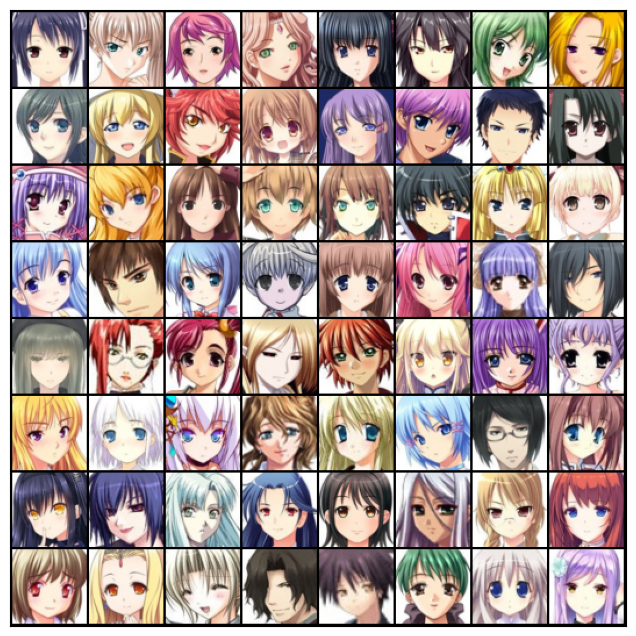

In [14]:
show_batch(train_dl)

## Using a GPU

To seamlessly use a GPU, if one is available, we define a couple of helper functions (`get_default_device` & `to_device`) and a helper class `DeviceDataLoader` to move our model & data to the GPU, if one is available.

In [15]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')

def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Based on where you're running this notebook, your default device could be a CPU (`torch.device('cpu')`) or a GPU (`torch.device('cuda')`).

In [16]:
device = get_default_device()
device

device(type='cuda')

We can now move our training data loader using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available).

In [17]:
train_dl = DeviceDataLoader(train_dl, device)

## Discriminator Network

The discriminator takes an image as input, and tries to classify it as "real" or "generated". In this sense, it's like any other neural network. We'll use a convolutional neural networks (CNN) which outputs a single number output for every image. We'll use stride of 2 to progressively reduce the size of the output feature map.

![](https://github.com/vdumoulin/conv_arithmetic/raw/master/gif/padding_strides_odd.gif)

In [18]:
import torch.nn as nn

In [19]:
discriminator = nn.Sequential(
    # in: 3 x 64 x 64

    nn.Conv2d(3, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 64 x 32 x 32

    nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 128 x 16 x 16

    nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 256 x 8 x 8

    nn.Conv2d(256, 512, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(512),
    nn.LeakyReLU(0.2, inplace=True),
    # out: 512 x 4 x 4

    nn.Conv2d(512, 1, kernel_size=4, stride=1, padding=0, bias=False),
    # out: 1 x 1 x 1

    nn.Flatten(),
    nn.Sigmoid())

Note that we're using the Leaky ReLU activation for the discriminator.

<img src="https://cdn-images-1.medium.com/max/1600/1*ypsvQH7kvtI2BhzR2eT_Sw.png" width="420">


>  Different from the regular ReLU function, Leaky ReLU allows the pass of a small gradient signal for negative values. As a result, it makes the gradients from the discriminator flows stronger into the generator. Instead of passing a gradient (slope) of 0 in the back-prop pass, it passes a small negative gradient.  - [Source](https://sthalles.github.io/advanced_gans/)

Just like any other binary classification model, the output of the discriminator is a single number between 0 and 1, which can be interpreted as the probability of the input image being real i.e. picked from the original dataset.

Let's move the discriminator model to the chosen device.

In [20]:
discriminator = to_device(discriminator, device)

## Generator Network

The input to the generator is typically a vector or a matrix of random numbers (referred to as a latent tensor) which is used as a seed for generating an image. The generator will convert a latent tensor of shape `(128, 1, 1)` into an image tensor of shape `3 x 28 x 28`. To achive this, we'll use the `ConvTranspose2d` layer from PyTorch, which is performs to as a *transposed convolution* (also referred to as a *deconvolution*). [Learn more](https://github.com/vdumoulin/conv_arithmetic/blob/master/README.md#transposed-convolution-animations)

![](https://i.imgur.com/DRvK546.gif)

In [21]:
latent_size = 128

In [22]:
generator = nn.Sequential(
    # in: latent_size x 1 x 1

    nn.ConvTranspose2d(latent_size, 512, kernel_size=4, stride=1, padding=0, bias=False),
    nn.BatchNorm2d(512),
    nn.ReLU(True),
    # out: 512 x 4 x 4

    nn.ConvTranspose2d(512, 256, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(256),
    nn.ReLU(True),
    # out: 256 x 8 x 8

    nn.ConvTranspose2d(256, 128, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(128),
    nn.ReLU(True),
    # out: 128 x 16 x 16

    nn.ConvTranspose2d(128, 64, kernel_size=4, stride=2, padding=1, bias=False),
    nn.BatchNorm2d(64),
    nn.ReLU(True),
    # out: 64 x 32 x 32

    nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=1, bias=False),
    nn.Tanh()
    # out: 3 x 64 x 64
)

We use the TanH activation function for the output layer of the generator.

<img src="https://nic.schraudolph.org/teach/NNcourse/figs/tanh.gif" width="420" >

> "The ReLU activation (Nair & Hinton, 2010) is used in the generator with the exception of the output layer which uses the Tanh function. We observed that using a bounded activation allowed the model to learn more quickly to saturate and cover the color space of the training distribution. Within the discriminator we found the leaky rectified activation (Maas et al., 2013) (Xu et al., 2015) to work well, especially for higher resolution modeling." - [Source](https://stackoverflow.com/questions/41489907/generative-adversarial-networks-tanh)


Note that since the outputs of the TanH activation lie in the range `[-1,1]`, we have applied the similar transformation to the images in the training dataset. Let's generate some outputs using the generator and view them as images by transforming and denormalizing the output.

torch.Size([128, 128, 1, 1])
torch.Size([128, 3, 64, 64])


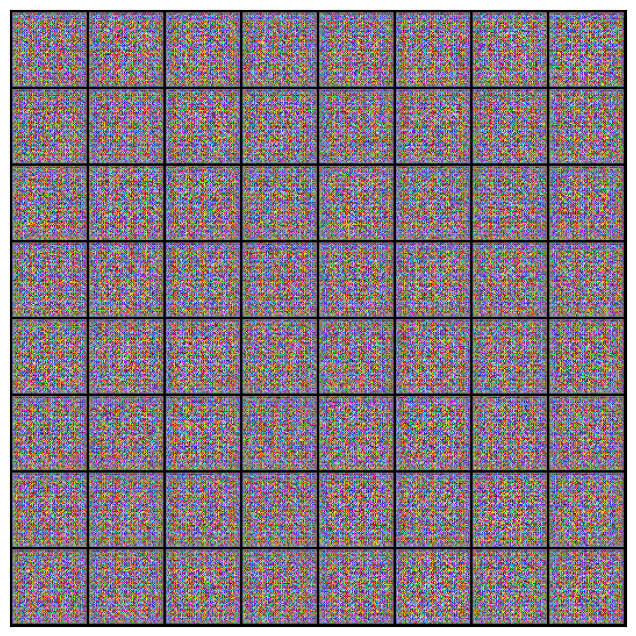

In [23]:
xb = torch.randn(batch_size, latent_size, 1, 1) # random latent tensors
print(xb.shape)
fake_images = generator(xb)
print(fake_images.shape)
show_images(fake_images)

As one might expect, the output from the generator is basically random noise, since we haven't trained it yet.

Let's move the generator to the chosen device.

In [24]:
generator = to_device(generator, device)

## Discriminator Training

Since the discriminator is a binary classification model, we can use the binary cross entropy loss function to quantify how well it is able to differentiate between real and generated images.

<img src="https://image.slidesharecdn.com/chrishokamp-dublinnlp3-160805110319/95/task-based-learning-for-nlp-going-beyond-cross-entropy-chris-hokamp-10-638.jpg?cb=1470395213" width="420" >

In [25]:
def train_discriminator(real_images, opt_d):
    # Clear discriminator gradients
    opt_d.zero_grad()

    # Pass real images through discriminator
    real_preds = discriminator(real_images)
    real_targets = torch.ones(real_images.size(0), 1, device=device)
    real_loss = F.binary_cross_entropy(real_preds, real_targets)
    real_score = torch.mean(real_preds).item()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Pass fake images through discriminator
    fake_targets = torch.zeros(fake_images.size(0), 1, device=device)
    fake_preds = discriminator(fake_images)
    fake_loss = F.binary_cross_entropy(fake_preds, fake_targets)
    fake_score = torch.mean(fake_preds).item()

    # Update discriminator weights
    loss = real_loss + fake_loss
    loss.backward()
    opt_d.step()
    return loss.item(), real_score, fake_score

Here are the steps involved in training the discriminator.

- We expect the discriminator to output 1 if the image was picked from the real MNIST dataset, and 0 if it was generated using the generator network.

- We first pass a batch of real images, and compute the loss, setting the target labels to 1.

- Then we pass a batch of fake images (generated using the generator) pass them into the discriminator, and compute the loss, setting the target labels to 0.

- Finally we add the two losses and use the overall loss to perform gradient descent to adjust the weights of the discriminator.

It's important to note that we don't change the weights of the generator model while training the discriminator (`opt_d` only affects the `discriminator.parameters()`)

## Generator Training

Since the outputs of the generator are images, it's not obvious how we can train the generator. This is where we employ a rather elegant trick, which is to use the discriminator as a part of the loss function. Here's how it works:

- We generate a batch of images using the generator, pass the into the discriminator.

- We calculate the loss by setting the target labels to 1 i.e. real. We do this because the generator's objective is to "fool" the discriminator.

- We use the loss to perform gradient descent i.e. change the weights of the generator, so it gets better at generating real-like images to "fool" the discriminator.

Here's what this looks like in code.

In [26]:
def train_generator(opt_g):
    # Clear generator gradients
    opt_g.zero_grad()

    # Generate fake images
    latent = torch.randn(batch_size, latent_size, 1, 1, device=device)
    fake_images = generator(latent)

    # Try to fool the discriminator
    preds = discriminator(fake_images)
    targets = torch.ones(batch_size, 1, device=device)  # main step
    loss = F.binary_cross_entropy(preds, targets)

    # Update generator weights
    loss.backward()
    opt_g.step()

    return loss.item()

Let's create a directory where we can save intermediate outputs from the generator to visually inspect the progress of the model. We'll also create a helper function to export the generated images.

In [27]:
from torchvision.utils import save_image

In [28]:
sample_dir = 'generated'
os.makedirs(sample_dir, exist_ok=True)

In [29]:
latent_tensors = torch.randn(128, 128, 1, 1)
fake_images = generator(latent_tensors)

RuntimeError: Input type (torch.FloatTensor) and weight type (torch.cuda.FloatTensor) should be the same or input should be a MKLDNN tensor and weight is a dense tensor

In [30]:
fake_images[0], fake_images[0].max(), fake_images[0].min()

(tensor([[[-0.0080,  0.3678, -0.1310,  ...,  0.3853,  0.1098, -0.0029],
          [-0.0649,  0.4352, -0.5318,  ..., -0.4372,  0.2694,  0.0043],
          [-0.0802,  0.4743, -0.5909,  ...,  0.2619, -0.2144, -0.0961],
          ...,
          [-0.0487, -0.1990,  0.5080,  ..., -0.5162,  0.1120, -0.0376],
          [-0.2975,  0.4823, -0.4957,  ...,  0.0189,  0.1920, -0.2628],
          [-0.1317, -0.0143, -0.2095,  ..., -0.1469,  0.1232,  0.0250]],
 
         [[-0.0039, -0.1081, -0.0706,  ..., -0.0196,  0.0055, -0.2375],
          [-0.0474, -0.4093, -0.6424,  ..., -0.0572, -0.2624, -0.1072],
          [-0.2319, -0.4418,  0.5917,  ..., -0.2349,  0.6063, -0.0036],
          ...,
          [-0.2939,  0.0193,  0.1596,  ..., -0.0170, -0.2385,  0.0516],
          [ 0.0735,  0.0693,  0.6530,  ...,  0.0360, -0.3601, -0.3467],
          [-0.1952,  0.1288, -0.2169,  ...,  0.0148, -0.0061,  0.1845]],
 
         [[ 0.0943, -0.1870, -0.0631,  ..., -0.1400, -0.0141, -0.0661],
          [ 0.3485,  0.3685,

In [31]:
x = denorm(fake_images[0])
x, x.max(), x.min()

(tensor([[[0.4960, 0.6839, 0.4345,  ..., 0.6926, 0.5549, 0.4986],
          [0.4675, 0.7176, 0.2341,  ..., 0.2814, 0.6347, 0.5021],
          [0.4599, 0.7372, 0.2046,  ..., 0.6310, 0.3928, 0.4520],
          ...,
          [0.4756, 0.4005, 0.7540,  ..., 0.2419, 0.5560, 0.4812],
          [0.3513, 0.7411, 0.2522,  ..., 0.5094, 0.5960, 0.3686],
          [0.4342, 0.4928, 0.3952,  ..., 0.4266, 0.5616, 0.5125]],
 
         [[0.4980, 0.4459, 0.4647,  ..., 0.4902, 0.5028, 0.3813],
          [0.4763, 0.2953, 0.1788,  ..., 0.4714, 0.3688, 0.4464],
          [0.3840, 0.2791, 0.7959,  ..., 0.3825, 0.8031, 0.4982],
          ...,
          [0.3531, 0.5096, 0.5798,  ..., 0.4915, 0.3808, 0.5258],
          [0.5368, 0.5347, 0.8265,  ..., 0.5180, 0.3200, 0.3267],
          [0.4024, 0.5644, 0.3916,  ..., 0.5074, 0.4969, 0.5923]],
 
         [[0.5471, 0.4065, 0.4684,  ..., 0.4300, 0.4930, 0.4669],
          [0.6743, 0.6842, 0.3358,  ..., 0.6284, 0.4583, 0.5203],
          [0.6003, 0.1535, 0.6138,  ...,

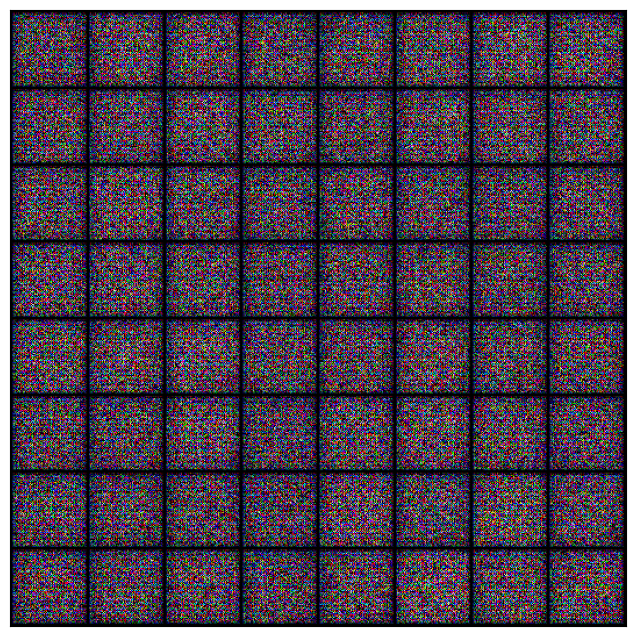

In [32]:
nmax=64
fig, ax = plt.subplots(figsize=(8, 8))
ax.set_xticks([]); ax.set_yticks([])
ax.imshow(make_grid(fake_images.cpu()[:nmax], nrow=8).permute(1, 2, 0))

In [33]:
fake_images[0]

tensor([[[-0.0080,  0.3678, -0.1310,  ...,  0.3853,  0.1098, -0.0029],
         [-0.0649,  0.4352, -0.5318,  ..., -0.4372,  0.2694,  0.0043],
         [-0.0802,  0.4743, -0.5909,  ...,  0.2619, -0.2144, -0.0961],
         ...,
         [-0.0487, -0.1990,  0.5080,  ..., -0.5162,  0.1120, -0.0376],
         [-0.2975,  0.4823, -0.4957,  ...,  0.0189,  0.1920, -0.2628],
         [-0.1317, -0.0143, -0.2095,  ..., -0.1469,  0.1232,  0.0250]],

        [[-0.0039, -0.1081, -0.0706,  ..., -0.0196,  0.0055, -0.2375],
         [-0.0474, -0.4093, -0.6424,  ..., -0.0572, -0.2624, -0.1072],
         [-0.2319, -0.4418,  0.5917,  ..., -0.2349,  0.6063, -0.0036],
         ...,
         [-0.2939,  0.0193,  0.1596,  ..., -0.0170, -0.2385,  0.0516],
         [ 0.0735,  0.0693,  0.6530,  ...,  0.0360, -0.3601, -0.3467],
         [-0.1952,  0.1288, -0.2169,  ...,  0.0148, -0.0061,  0.1845]],

        [[ 0.0943, -0.1870, -0.0631,  ..., -0.1400, -0.0141, -0.0661],
         [ 0.3485,  0.3685, -0.3284,  ...,  0

In [34]:
fake_images.detach()[0]

tensor([[[-0.0080,  0.3678, -0.1310,  ...,  0.3853,  0.1098, -0.0029],
         [-0.0649,  0.4352, -0.5318,  ..., -0.4372,  0.2694,  0.0043],
         [-0.0802,  0.4743, -0.5909,  ...,  0.2619, -0.2144, -0.0961],
         ...,
         [-0.0487, -0.1990,  0.5080,  ..., -0.5162,  0.1120, -0.0376],
         [-0.2975,  0.4823, -0.4957,  ...,  0.0189,  0.1920, -0.2628],
         [-0.1317, -0.0143, -0.2095,  ..., -0.1469,  0.1232,  0.0250]],

        [[-0.0039, -0.1081, -0.0706,  ..., -0.0196,  0.0055, -0.2375],
         [-0.0474, -0.4093, -0.6424,  ..., -0.0572, -0.2624, -0.1072],
         [-0.2319, -0.4418,  0.5917,  ..., -0.2349,  0.6063, -0.0036],
         ...,
         [-0.2939,  0.0193,  0.1596,  ..., -0.0170, -0.2385,  0.0516],
         [ 0.0735,  0.0693,  0.6530,  ...,  0.0360, -0.3601, -0.3467],
         [-0.1952,  0.1288, -0.2169,  ...,  0.0148, -0.0061,  0.1845]],

        [[ 0.0943, -0.1870, -0.0631,  ..., -0.1400, -0.0141, -0.0661],
         [ 0.3485,  0.3685, -0.3284,  ...,  0

In summary, `detach()` is useful for creating a tensor that shares the same data as the original but is not involved in the computation graph, making it suitable for operations where gradient tracking is unnecessary.

In [35]:
def save_samples(index, latent_tensors, show=True):
    fake_images = generator(latent_tensors)
    fake_fname = 'generated-images-{0:0=4d}.png'.format(index)
    save_image(denorm(fake_images), os.path.join(sample_dir, fake_fname), nrow=8)
    print('Saving', fake_fname)
    if show:
      nmax=64
      fig, ax = plt.subplots(figsize=(8, 8))
      ax.set_xticks([]); ax.set_yticks([])
      ax.imshow(make_grid(fake_images.cpu().detach()[:nmax], nrow=8).permute(1, 2, 0))

We'll use a fixed set of input vectors to the generator to see how the individual generated images evolve over time as we train the model. Let's save one set of images before we start training our model.

In [36]:
fixed_latent = torch.randn(64, latent_size, 1, 1, device=device)

Saving generated-images-0000.png


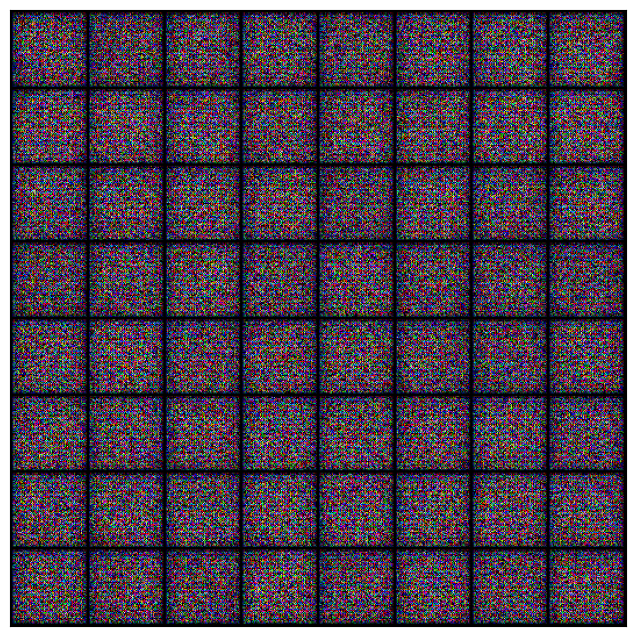

In [37]:
save_samples(0, fixed_latent)

## Full Training Loop

Let's define a `fit` function to train the discriminator and generator in tandem for each batch of training data. We'll use the Adam optimizer with some custom parameters (betas) that are known to work well for GANs. We will also save some sample generated images at regular intervals for inspection.

<img src="https://i.imgur.com/6NMdO9u.png" style="max-width:420px; margin-bottom:32px"/>



In [38]:
from tqdm.notebook import tqdm
import torch.nn.functional as F

In [39]:
def fit(epochs, lr, start_idx=1):
    torch.cuda.empty_cache()

    # Losses & scores
    losses_g = []
    losses_d = []
    real_scores = []
    fake_scores = []

    # Create optimizers
    opt_d = torch.optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))
    opt_g = torch.optim.Adam(generator.parameters(), lr=lr, betas=(0.5, 0.999))

    for epoch in range(epochs):
        for real_images, _ in tqdm(train_dl):
            # Train discriminator
            loss_d, real_score, fake_score = train_discriminator(real_images, opt_d)
            # Train generator
            loss_g = train_generator(opt_g)

        # Record losses & scores
        losses_g.append(loss_g)
        losses_d.append(loss_d)
        real_scores.append(real_score)
        fake_scores.append(fake_score)

        # Log losses & scores (last batch)
        print("Epoch [{}/{}], loss_g: {:.4f}, loss_d: {:.4f}, real_score: {:.4f}, fake_score: {:.4f}".format(
            epoch+1, epochs, loss_g, loss_d, real_score, fake_score))

        # Save generated images
        save_samples(epoch+start_idx, fixed_latent, show=False)

    return losses_g, losses_d, real_scores, fake_scores

We are now ready to train the model. Try different learning rates to see if you can maintain the fine balance between the training the generator and the discriminator.

In [40]:
lr = 0.0001
epochs = 100

In [41]:
history = fit(epochs, lr)

  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [1/100], loss_g: 4.2868, loss_d: 0.2605, real_score: 0.8839, fake_score: 0.1015
Saving generated-images-0001.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [2/100], loss_g: 6.9684, loss_d: 0.4845, real_score: 0.9484, fake_score: 0.3201
Saving generated-images-0002.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [3/100], loss_g: 5.0350, loss_d: 0.3843, real_score: 0.7630, fake_score: 0.0140
Saving generated-images-0003.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [4/100], loss_g: 4.6266, loss_d: 0.1747, real_score: 0.9773, fake_score: 0.1329
Saving generated-images-0004.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [5/100], loss_g: 4.0018, loss_d: 0.1892, real_score: 0.8715, fake_score: 0.0072
Saving generated-images-0005.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [6/100], loss_g: 4.8514, loss_d: 0.1904, real_score: 0.9117, fake_score: 0.0716
Saving generated-images-0006.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [7/100], loss_g: 5.1217, loss_d: 0.1221, real_score: 0.9560, fake_score: 0.0677
Saving generated-images-0007.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [8/100], loss_g: 4.9150, loss_d: 0.1245, real_score: 0.9080, fake_score: 0.0147
Saving generated-images-0008.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [9/100], loss_g: 5.3710, loss_d: 0.1794, real_score: 0.8939, fake_score: 0.0059
Saving generated-images-0009.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [10/100], loss_g: 6.3341, loss_d: 0.1169, real_score: 0.9817, fake_score: 0.0878
Saving generated-images-0010.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [11/100], loss_g: 6.8531, loss_d: 0.1816, real_score: 0.9476, fake_score: 0.0981
Saving generated-images-0011.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [12/100], loss_g: 5.1005, loss_d: 0.0846, real_score: 0.9424, fake_score: 0.0056
Saving generated-images-0012.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [13/100], loss_g: 5.4766, loss_d: 0.0905, real_score: 0.9580, fake_score: 0.0363
Saving generated-images-0013.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [14/100], loss_g: 6.6120, loss_d: 0.0655, real_score: 0.9810, fake_score: 0.0403
Saving generated-images-0014.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [15/100], loss_g: 6.3318, loss_d: 0.0516, real_score: 0.9780, fake_score: 0.0211
Saving generated-images-0015.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [16/100], loss_g: 13.6787, loss_d: 0.0542, real_score: 0.9998, fake_score: 0.0466
Saving generated-images-0016.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [17/100], loss_g: 8.0469, loss_d: 0.0779, real_score: 0.9899, fake_score: 0.0632
Saving generated-images-0017.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [18/100], loss_g: 8.6993, loss_d: 0.0851, real_score: 0.9794, fake_score: 0.0568
Saving generated-images-0018.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [19/100], loss_g: 4.3956, loss_d: 0.1255, real_score: 0.9282, fake_score: 0.0144
Saving generated-images-0019.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [20/100], loss_g: 9.8978, loss_d: 0.0096, real_score: 0.9935, fake_score: 0.0027
Saving generated-images-0020.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [21/100], loss_g: 7.2196, loss_d: 0.0428, real_score: 0.9813, fake_score: 0.0221
Saving generated-images-0021.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [22/100], loss_g: 20.7219, loss_d: 0.0870, real_score: 0.9978, fake_score: 0.0522
Saving generated-images-0022.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [23/100], loss_g: 5.2218, loss_d: 0.0687, real_score: 0.9786, fake_score: 0.0435
Saving generated-images-0023.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [24/100], loss_g: 14.1521, loss_d: 0.1804, real_score: 0.9191, fake_score: 0.0339
Saving generated-images-0024.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [25/100], loss_g: 10.3403, loss_d: 0.0683, real_score: 0.9577, fake_score: 0.0082
Saving generated-images-0025.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [26/100], loss_g: 9.1660, loss_d: 0.1303, real_score: 0.9964, fake_score: 0.1147
Saving generated-images-0026.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [27/100], loss_g: 9.0817, loss_d: 0.0698, real_score: 0.9466, fake_score: 0.0018
Saving generated-images-0027.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [28/100], loss_g: 8.6748, loss_d: 0.1379, real_score: 0.9699, fake_score: 0.0850
Saving generated-images-0028.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [29/100], loss_g: 8.7925, loss_d: 0.2209, real_score: 0.8596, fake_score: 0.0003
Saving generated-images-0029.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [30/100], loss_g: 5.2708, loss_d: 0.0625, real_score: 0.9509, fake_score: 0.0015
Saving generated-images-0030.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [31/100], loss_g: 5.7942, loss_d: 0.0167, real_score: 0.9886, fake_score: 0.0023
Saving generated-images-0031.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [32/100], loss_g: 7.1599, loss_d: 0.0667, real_score: 0.9522, fake_score: 0.0086
Saving generated-images-0032.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [33/100], loss_g: 5.4615, loss_d: 0.0365, real_score: 0.9905, fake_score: 0.0259
Saving generated-images-0033.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [34/100], loss_g: 6.3507, loss_d: 0.0327, real_score: 0.9969, fake_score: 0.0288
Saving generated-images-0034.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [35/100], loss_g: 8.6492, loss_d: 0.1352, real_score: 0.9312, fake_score: 0.0007
Saving generated-images-0035.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [36/100], loss_g: 7.2457, loss_d: 0.0234, real_score: 0.9882, fake_score: 0.0106
Saving generated-images-0036.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [37/100], loss_g: 8.9864, loss_d: 0.1812, real_score: 0.8734, fake_score: 0.0002
Saving generated-images-0037.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [38/100], loss_g: 7.5505, loss_d: 0.0844, real_score: 0.9782, fake_score: 0.0577
Saving generated-images-0038.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [39/100], loss_g: 9.8755, loss_d: 0.0962, real_score: 0.9982, fake_score: 0.0866
Saving generated-images-0039.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [40/100], loss_g: 6.6748, loss_d: 0.0289, real_score: 0.9914, fake_score: 0.0195
Saving generated-images-0040.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [41/100], loss_g: 5.5984, loss_d: 0.0327, real_score: 0.9915, fake_score: 0.0233
Saving generated-images-0041.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [42/100], loss_g: 5.4631, loss_d: 0.0153, real_score: 0.9910, fake_score: 0.0059
Saving generated-images-0042.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [43/100], loss_g: 5.0409, loss_d: 0.0241, real_score: 0.9889, fake_score: 0.0114
Saving generated-images-0043.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [44/100], loss_g: 9.9548, loss_d: 0.0884, real_score: 0.9921, fake_score: 0.0724
Saving generated-images-0044.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [45/100], loss_g: 8.2012, loss_d: 0.0303, real_score: 0.9888, fake_score: 0.0176
Saving generated-images-0045.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [46/100], loss_g: 5.6634, loss_d: 0.0744, real_score: 0.9657, fake_score: 0.0331
Saving generated-images-0046.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [47/100], loss_g: 6.9968, loss_d: 0.0289, real_score: 0.9834, fake_score: 0.0040
Saving generated-images-0047.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [48/100], loss_g: 27.3674, loss_d: 0.0000, real_score: 1.0000, fake_score: 0.0000
Saving generated-images-0048.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [49/100], loss_g: 8.7368, loss_d: 0.0304, real_score: 0.9808, fake_score: 0.0060
Saving generated-images-0049.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [50/100], loss_g: 9.7728, loss_d: 0.0723, real_score: 0.9486, fake_score: 0.0010
Saving generated-images-0050.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [51/100], loss_g: 7.6956, loss_d: 0.0530, real_score: 0.9902, fake_score: 0.0398
Saving generated-images-0051.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [52/100], loss_g: 6.2412, loss_d: 0.0117, real_score: 0.9945, fake_score: 0.0060
Saving generated-images-0052.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [53/100], loss_g: 7.5222, loss_d: 0.0112, real_score: 0.9979, fake_score: 0.0089
Saving generated-images-0053.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [54/100], loss_g: 5.3697, loss_d: 0.0526, real_score: 0.9621, fake_score: 0.0089
Saving generated-images-0054.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [55/100], loss_g: 4.8998, loss_d: 0.0529, real_score: 0.9650, fake_score: 0.0106
Saving generated-images-0055.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [56/100], loss_g: 6.7944, loss_d: 0.0037, real_score: 0.9977, fake_score: 0.0014
Saving generated-images-0056.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [57/100], loss_g: 6.4954, loss_d: 0.0321, real_score: 0.9989, fake_score: 0.0278
Saving generated-images-0057.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [58/100], loss_g: 5.9214, loss_d: 0.0417, real_score: 0.9657, fake_score: 0.0024
Saving generated-images-0058.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [59/100], loss_g: 7.5420, loss_d: 0.0378, real_score: 0.9923, fake_score: 0.0267
Saving generated-images-0059.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [60/100], loss_g: 3.1920, loss_d: 0.0951, real_score: 0.9393, fake_score: 0.0092
Saving generated-images-0060.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [61/100], loss_g: 5.8718, loss_d: 0.0527, real_score: 0.9963, fake_score: 0.0457
Saving generated-images-0061.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [62/100], loss_g: 8.1635, loss_d: 0.0167, real_score: 0.9928, fake_score: 0.0090
Saving generated-images-0062.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [63/100], loss_g: 7.4826, loss_d: 0.0700, real_score: 0.9567, fake_score: 0.0012
Saving generated-images-0063.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [64/100], loss_g: 3.8276, loss_d: 0.0961, real_score: 0.9405, fake_score: 0.0119
Saving generated-images-0064.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [65/100], loss_g: 9.3715, loss_d: 0.0795, real_score: 0.9887, fake_score: 0.0634
Saving generated-images-0065.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [66/100], loss_g: 8.1701, loss_d: 0.0491, real_score: 0.9871, fake_score: 0.0145
Saving generated-images-0066.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [67/100], loss_g: 9.5671, loss_d: 0.0465, real_score: 0.9614, fake_score: 0.0004
Saving generated-images-0067.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [68/100], loss_g: 5.0627, loss_d: 0.0444, real_score: 0.9786, fake_score: 0.0181
Saving generated-images-0068.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [69/100], loss_g: 6.6835, loss_d: 0.0170, real_score: 0.9967, fake_score: 0.0134
Saving generated-images-0069.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [70/100], loss_g: 2.1261, loss_d: 0.1533, real_score: 0.9077, fake_score: 0.0152
Saving generated-images-0070.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [71/100], loss_g: 22.0558, loss_d: 0.0566, real_score: 0.9701, fake_score: 0.0164
Saving generated-images-0071.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [72/100], loss_g: 6.8152, loss_d: 0.0103, real_score: 0.9915, fake_score: 0.0012
Saving generated-images-0072.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [73/100], loss_g: 2.9662, loss_d: 0.0912, real_score: 0.9389, fake_score: 0.0040
Saving generated-images-0073.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [74/100], loss_g: 13.2044, loss_d: 0.1372, real_score: 0.9929, fake_score: 0.1028
Saving generated-images-0074.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [75/100], loss_g: 12.7959, loss_d: 0.0045, real_score: 0.9967, fake_score: 0.0012
Saving generated-images-0075.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [76/100], loss_g: 9.3863, loss_d: 0.0278, real_score: 0.9981, fake_score: 0.0248
Saving generated-images-0076.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [77/100], loss_g: 5.5675, loss_d: 0.0784, real_score: 0.9631, fake_score: 0.0021
Saving generated-images-0077.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [78/100], loss_g: 7.0441, loss_d: 0.0193, real_score: 0.9977, fake_score: 0.0165
Saving generated-images-0078.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [79/100], loss_g: 13.6353, loss_d: 0.0477, real_score: 0.9686, fake_score: 0.0008
Saving generated-images-0079.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [80/100], loss_g: 7.8986, loss_d: 0.0324, real_score: 0.9759, fake_score: 0.0012
Saving generated-images-0080.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [81/100], loss_g: 22.2180, loss_d: 0.0259, real_score: 0.9982, fake_score: 0.0225
Saving generated-images-0081.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [82/100], loss_g: 14.4959, loss_d: 0.0490, real_score: 0.9727, fake_score: 0.0001
Saving generated-images-0082.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [83/100], loss_g: 9.1752, loss_d: 0.0046, real_score: 0.9987, fake_score: 0.0033
Saving generated-images-0083.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [84/100], loss_g: 20.7223, loss_d: 0.0291, real_score: 0.9967, fake_score: 0.0240
Saving generated-images-0084.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [85/100], loss_g: 27.5335, loss_d: 0.0016, real_score: 1.0000, fake_score: 0.0016
Saving generated-images-0085.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [86/100], loss_g: 5.2601, loss_d: 0.0931, real_score: 0.9445, fake_score: 0.0097
Saving generated-images-0086.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [87/100], loss_g: 14.4453, loss_d: 0.0157, real_score: 0.9997, fake_score: 0.0149
Saving generated-images-0087.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [88/100], loss_g: 9.6821, loss_d: 0.1194, real_score: 0.9764, fake_score: 0.0670
Saving generated-images-0088.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [89/100], loss_g: 18.4747, loss_d: 0.0106, real_score: 0.9925, fake_score: 0.0026
Saving generated-images-0089.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [90/100], loss_g: 4.6686, loss_d: 0.0532, real_score: 0.9695, fake_score: 0.0071
Saving generated-images-0090.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [91/100], loss_g: 14.3144, loss_d: 0.0383, real_score: 0.9802, fake_score: 0.0018
Saving generated-images-0091.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [92/100], loss_g: 8.1633, loss_d: 0.0217, real_score: 0.9997, fake_score: 0.0207
Saving generated-images-0092.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [93/100], loss_g: 6.9192, loss_d: 0.0565, real_score: 0.9699, fake_score: 0.0015
Saving generated-images-0093.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [94/100], loss_g: 6.5765, loss_d: 0.0073, real_score: 0.9964, fake_score: 0.0036
Saving generated-images-0094.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [95/100], loss_g: 7.3564, loss_d: 0.0088, real_score: 0.9998, fake_score: 0.0085
Saving generated-images-0095.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [96/100], loss_g: 9.8705, loss_d: 0.0462, real_score: 0.9961, fake_score: 0.0396
Saving generated-images-0096.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [97/100], loss_g: 8.0549, loss_d: 0.0335, real_score: 0.9985, fake_score: 0.0305
Saving generated-images-0097.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [98/100], loss_g: 7.4726, loss_d: 0.0238, real_score: 0.9968, fake_score: 0.0200
Saving generated-images-0098.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [99/100], loss_g: 21.7432, loss_d: 0.0152, real_score: 0.9954, fake_score: 0.0094
Saving generated-images-0099.png


  0%|          | 0/497 [00:00<?, ?it/s]

Epoch [100/100], loss_g: 5.6809, loss_d: 0.0167, real_score: 0.9964, fake_score: 0.0129
Saving generated-images-0100.png


In [42]:
losses_g, losses_d, real_scores, fake_scores = history

Now that we have trained the models, we can save checkpoints.

In [43]:
# Save the model checkpoints
torch.save(generator.state_dict(), 'G.pth')
torch.save(discriminator.state_dict(), 'D.pth')

Here's how the generated images look, after the 1st, 5th and 10th epochs of training.

In [44]:
from IPython.display import Image

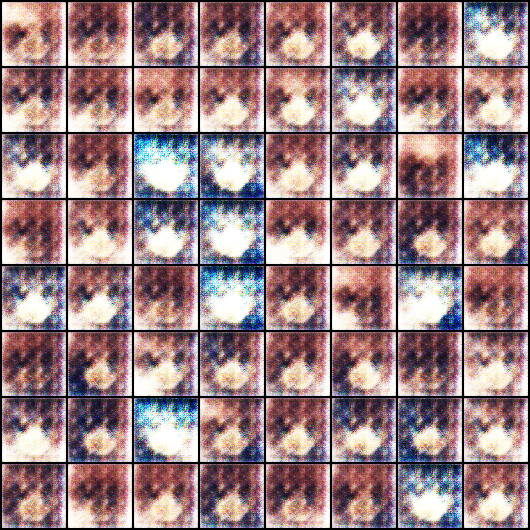

In [45]:
Image('./generated/generated-images-0001.png')

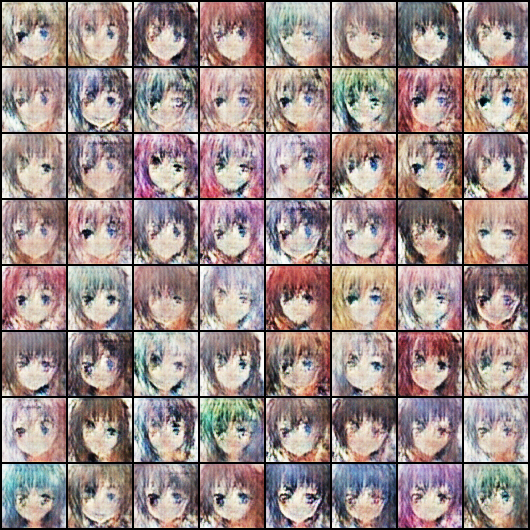

In [46]:
Image('./generated/generated-images-0005.png')

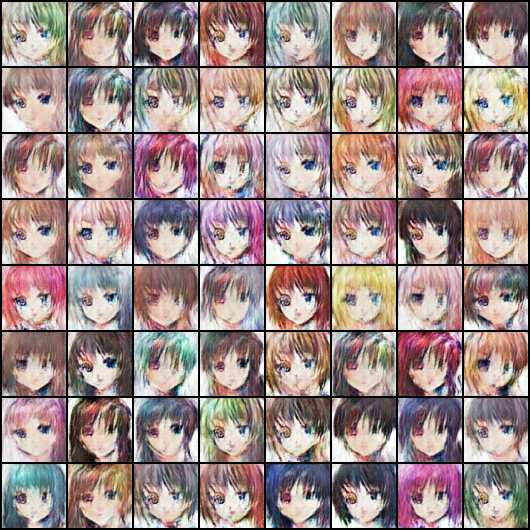

In [47]:
Image('./generated/generated-images-0010.png')

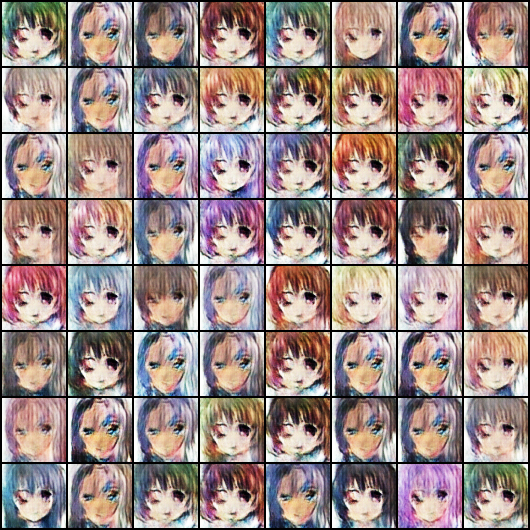

In [48]:
Image('./generated/generated-images-0020.png')

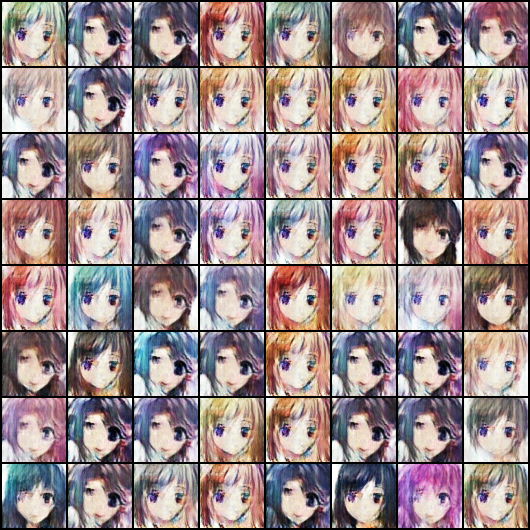

In [49]:
Image('./generated/generated-images-0025.png')

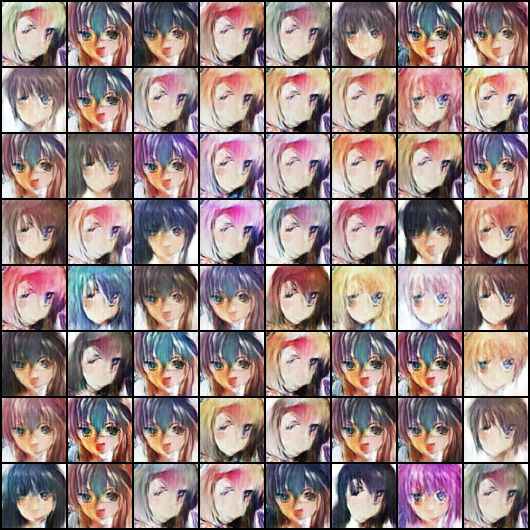

In [50]:
Image('./generated/generated-images-0030.png')

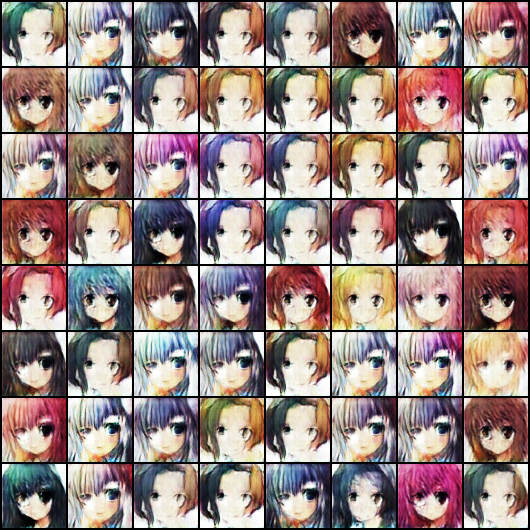

In [51]:
Image('./generated/generated-images-0035.png')

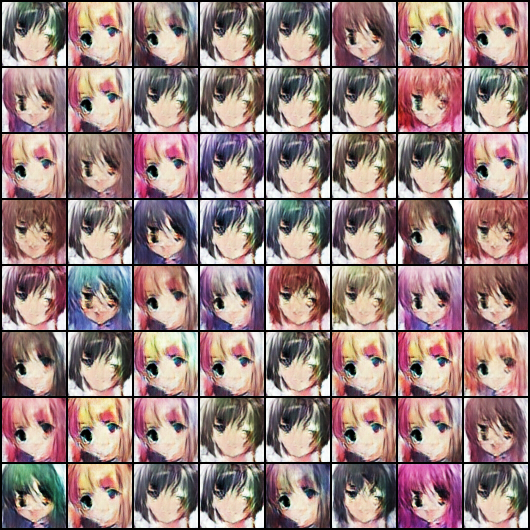

In [52]:
Image('./generated/generated-images-0040.png')

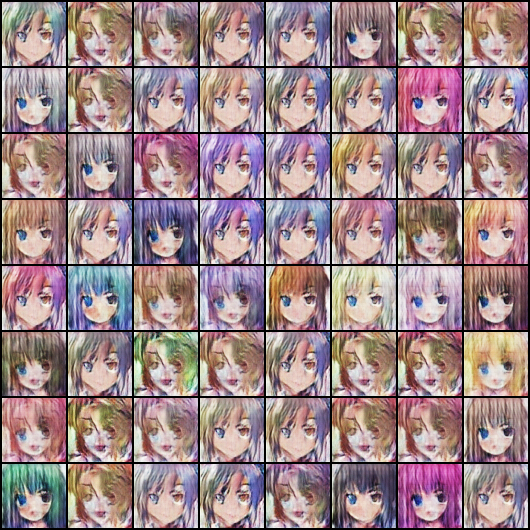

In [53]:
Image('./generated/generated-images-0050.png')

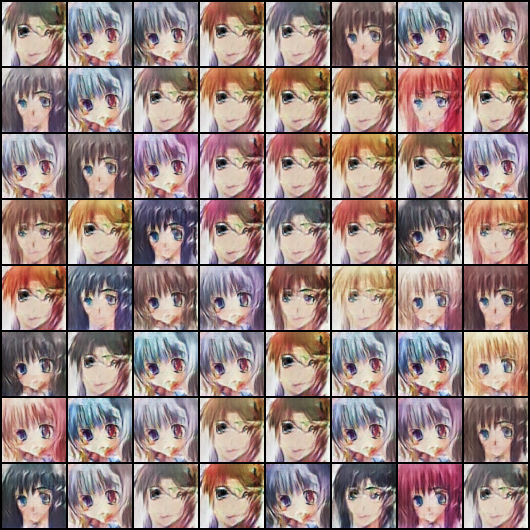

In [54]:
Image('./generated/generated-images-0060.png')

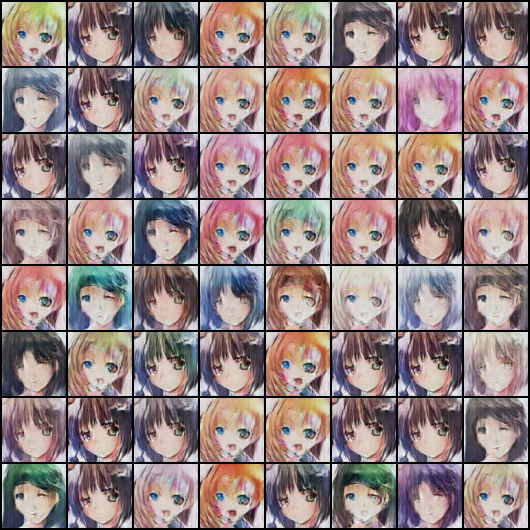

In [55]:
Image('./generated/generated-images-0070.png')

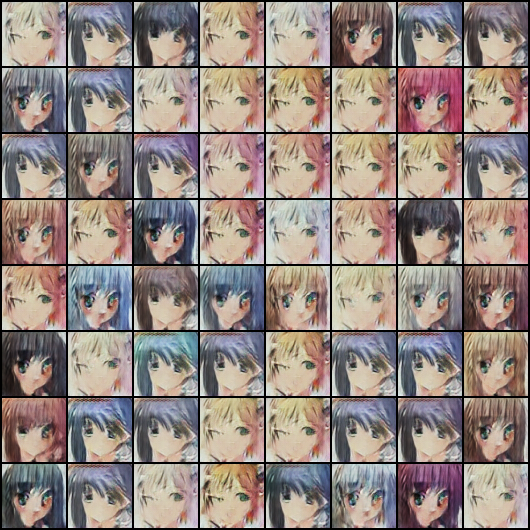

In [56]:
Image('./generated/generated-images-0080.png')

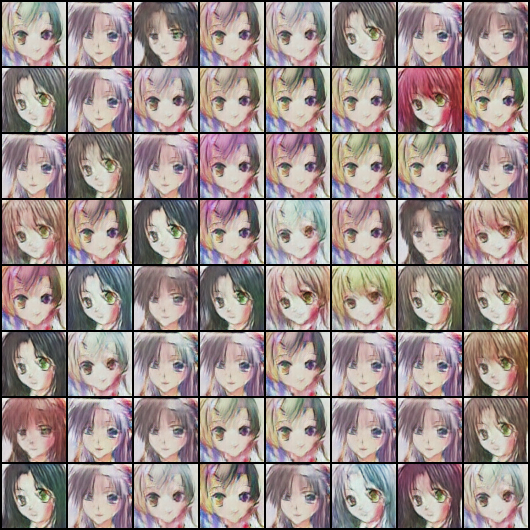

In [57]:
Image('./generated/generated-images-0090.png')

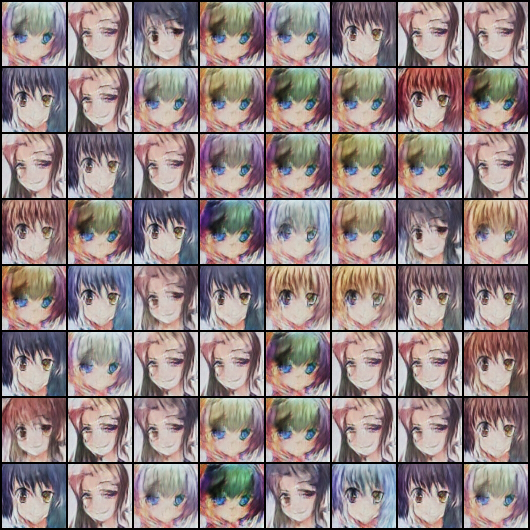

In [58]:
Image('./generated/generated-images-0100.png')

We can visualize the training process by combining the sample images generated after each epoch into a video using OpenCV.

In [59]:
import cv2
import os

vid_fname = 'gans_training.avi'

files = [os.path.join(sample_dir, f) for f in os.listdir(sample_dir) if 'generated' in f]
files.sort()

out = cv2.VideoWriter(vid_fname,cv2.VideoWriter_fourcc(*'MP4V'), 1, (530,530))
[out.write(cv2.imread(fname)) for fname in files]
out.release()

Here's what it looks like:

![]()


We can also visualize how the loss changes over time. Visualizing
losses is quite useful for debugging the training process. For GANs, we expect the generator's loss to reduce over time, without the discriminator's loss getting too high.



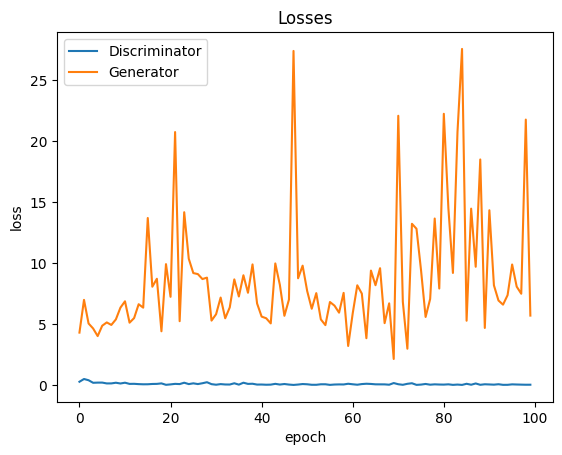

In [60]:
plt.plot(losses_d, '-')
plt.plot(losses_g, '-')
plt.xlabel('epoch')
plt.ylabel('loss')
plt.legend(['Discriminator', 'Generator'])
plt.title('Losses');

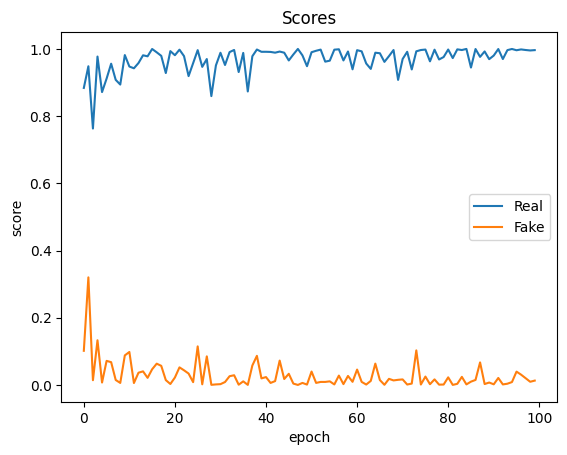

In [61]:
plt.plot(real_scores, '-')
plt.plot(fake_scores, '-')
plt.xlabel('epoch')
plt.ylabel('score')
plt.legend(['Real', 'Fake'])
plt.title('Scores');